In [1]:
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import os
import numpy as np
from PIL import Image
import seaborn as sns
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import cv2
%matplotlib inline

# Load Data

In [2]:
image_path="/kaggle/input/golden-foot-football-players-image-dataset/football_golden_foot/football_golden_foot/"

# Visualize Some Images

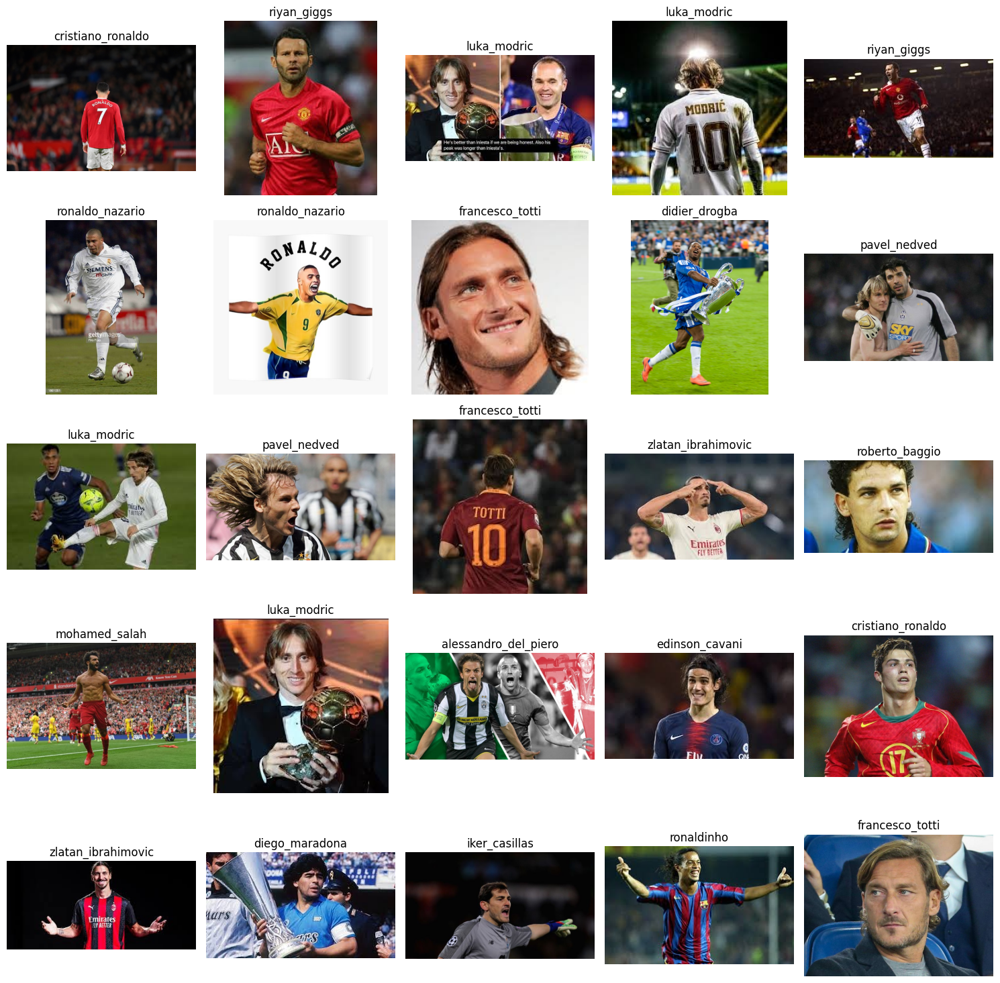

In [3]:
# List all directories (player names) in the dataset
players = os.listdir(image_path)

# Initialize a figure for plotting the images
fig, axes = plt.subplots(5, 5, figsize=(15, 15))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Select 25 random images from the dataset and plot them
for i in range(25):
    # Randomly select a player
    player = random.choice(players)
    
    # Get a list of image files for that player
    player_images = os.listdir(os.path.join(image_path, player))
    
    # Randomly select an image file for the player
    img_file = random.choice(player_images)
    
    # Load the image
    img = Image.open(os.path.join(image_path, player, img_file))
    
    # Display the image in the grid
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axes for better clarity
    axes[i].set_title(player)  # Set the player name as the title

# Adjust layout to make sure everything fits
plt.tight_layout()
plt.show()

# Compare Each Class Length

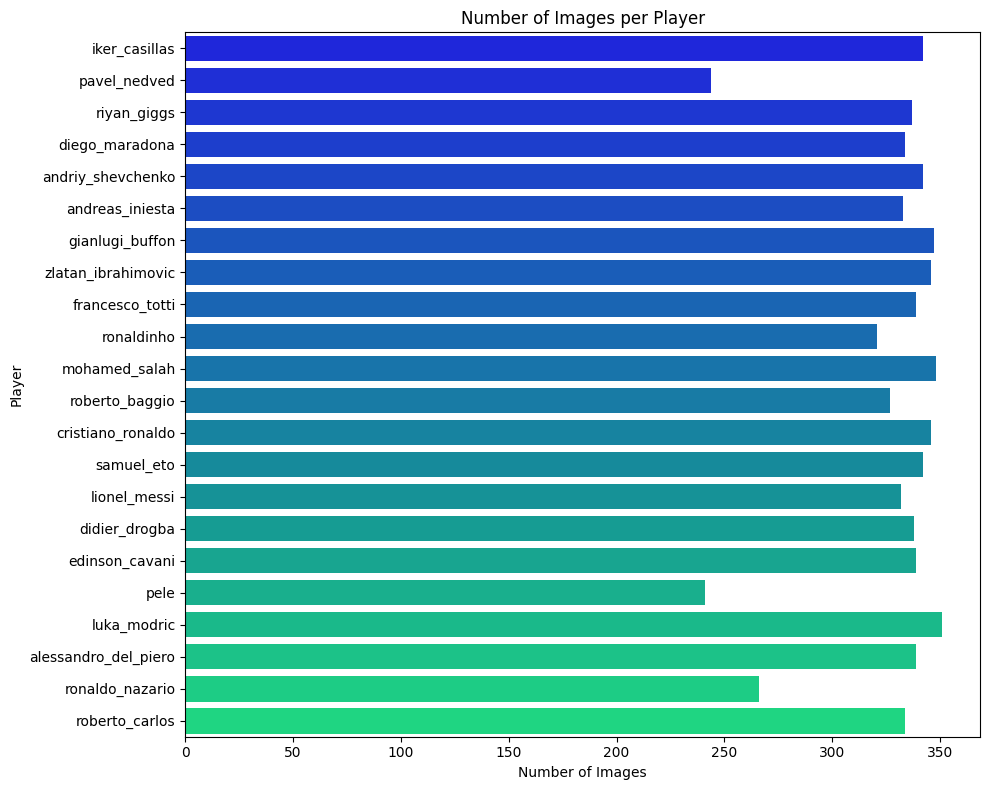

In [4]:
# List all directories (player names) in the dataset
players = os.listdir(image_path)

# Count the number of images for each player
image_counts = [len(os.listdir(os.path.join(image_path, player))) for player in players]

# Create a DataFrame for plotting
import pandas as pd
data = pd.DataFrame({
    'Player': players,
    'Image Count': image_counts
})

# Set up the seaborn plot
plt.figure(figsize=(10, 8))
sns.barplot(x='Image Count', y='Player', data=data, palette="winter")

# Set plot labels and title
plt.xlabel('Number of Images')
plt.ylabel('Player')
plt.title('Number of Images per Player')

# Show the plot
plt.tight_layout()
plt.show()

# Find Label Name

In [5]:
label_names=os.listdir(image_path)
label_names=[label for label in label_names if os.path.isdir(os.path.join(image_path,label))]
print(f"Label Names : {label_names}")

Label Names : ['iker_casillas', 'pavel_nedved', 'riyan_giggs', 'diego_maradona', 'andriy_shevchenko', 'andreas_iniesta', 'gianlugi_buffon', 'zlatan_ibrahimovic', 'francesco_totti', 'ronaldinho', 'mohamed_salah', 'roberto_baggio', 'cristiano_ronaldo', 'samuel_eto', 'lionel_messi', 'didier_drogba', 'edinson_cavani', 'pele', 'luka_modric', 'alessandro_del_piero', 'ronaldo_nazario', 'roberto_carlos']


# Load Image & Labels

In [6]:
images=[]
labels=[]

for label in tqdm(label_names):
    class_path=os.path.join(image_path,label)
    for filename in os.listdir(class_path):
        img_path=os.path.join(class_path,filename)
        img=cv2.imread(img_path)
        img=cv2.resize(img,(128,128))
        images.append(img)
        labels.append(label_names.index(label))


images=np.array(images)
labels=np.array(labels)


images = images / 255.0

100%|██████████| 22/22 [00:31<00:00,  1.41s/it]


#  Split the data into training, validation, and test sets

In [7]:
X_train, X_temp, Y_train, Y_temp = train_test_split(images, labels, test_size=0.4, stratify=labels, random_state=42)
X_valid, X_test, Y_valid, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, stratify=Y_temp, random_state=42)
print(f"X_train shape: {X_train.shape}")
print(f"X_valid shape: {X_valid.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"Y_train shape : {Y_train.shape}")
print(f"Y_valid shape : {Y_valid.shape}")
print(f"Y_test shape : {Y_test.shape}")

X_train shape: (4312, 128, 128, 3)
X_valid shape: (1438, 128, 128, 3)
X_test shape: (1438, 128, 128, 3)
Y_train shape : (4312,)
Y_valid shape : (1438,)
Y_test shape : (1438,)


#  Create pairs of images

In [8]:
def make_pairs(x, y):
    """Creates a tuple containing image pairs with corresponding label.

    Arguments:
        x: List containing images, each index in this list corresponds to one image.
        y: List containing labels, each label with datatype of `int`.

    Returns:
        Tuple containing two numpy arrays as (pairs_of_samples, labels),
        where pairs_of_samples' shape is (2len(x), 2,n_features_dims) and
        labels are a binary array of shape (2len(x)).
    """

    num_classes = max(y) + 1
    digit_indices = [np.where(y == i)[0] for i in range(num_classes)]

    pairs = []
    labels = []

    for idx1 in range(len(x)):
        # add a matching example
        x1 = x[idx1]
        label1 = y[idx1]
        idx2 = random.choice(digit_indices[label1])
        x2 = x[idx2]

        pairs += [[x1, x2]]
        labels += [1]

        # add a non-matching example
        label2 = random.randint(0, num_classes - 1)
        while label2 == label1:
            label2 = random.randint(0, num_classes - 1)

        idx2 = random.choice(digit_indices[label2])
        x2 = x[idx2]

        pairs += [[x1, x2]]
        labels += [0]

    return np.array(pairs), np.array(labels).astype("float32")


# make train pairs
pairs_train, labels_train = make_pairs(X_train, Y_train)

# make validation pairs
pairs_val, labels_val = make_pairs(X_valid, Y_valid)

# make test pairs
pairs_test, labels_test = make_pairs(X_test, Y_test)

* 1. we have 8624 sample
* 2. Each pair contains 2 images
* 3. each image has shape (128,128)

In [9]:
print(f"Pairs Shape : {pairs_train.shape}")

Pairs Shape : (8624, 2, 128, 128, 3)


# Split Training Pairs

In [10]:
X_train_1 = pairs_train[:, 0]  
X_train_2 = pairs_train[:, 1]

print(f"Train_1 Shape : {X_train_1.shape}")
print(f"Train_2 Shape : {X_train_2.shape}")

Train_1 Shape : (8624, 128, 128, 3)
Train_2 Shape : (8624, 128, 128, 3)


# Split validation Pairs

In [11]:
X_val_1 = pairs_val[:, 0]  # x_val_1.shape = (60000, 28, 28)
X_val_2 = pairs_val[:, 1]

# Split Test Pairs

In [12]:
X_test_1 = pairs_test[:, 0]  # x_test_1.shape = (20000, 28, 28)
X_test_2 = pairs_test[:, 1]

# Visualize pairs and their labels

In [13]:
def visualize(pairs, labels, to_show=25, num_col=5, predictions=None, test=False):
    num_row = to_show // num_col if to_show // num_col != 0 else 1
    to_show = num_row * num_col

    fig, axes = plt.subplots(num_row, num_col, figsize=(15, 15))
    for i in range(to_show):
        if num_row == 1:
            ax = axes[i % num_col]
        else:
            ax = axes[i // num_col, i % num_col]

        ax.imshow(tf.concat([pairs[i][0], pairs[i][1]], axis=1), cmap="gray")
        ax.set_axis_off()

        if test:
            ax.set_title("True: {} | Pred: {:.5f}".format(labels[i], predictions[i][0]))
        else:
            ax.set_title("Label: {}".format(labels[i]))

    if test:
        plt.tight_layout(rect=(0, 0, 1.9, 1.9), w_pad=0.0)
    else:
        plt.tight_layout(rect=(0, 0, 1.5, 1.5))
    plt.show()

# Visualize Train Pairs

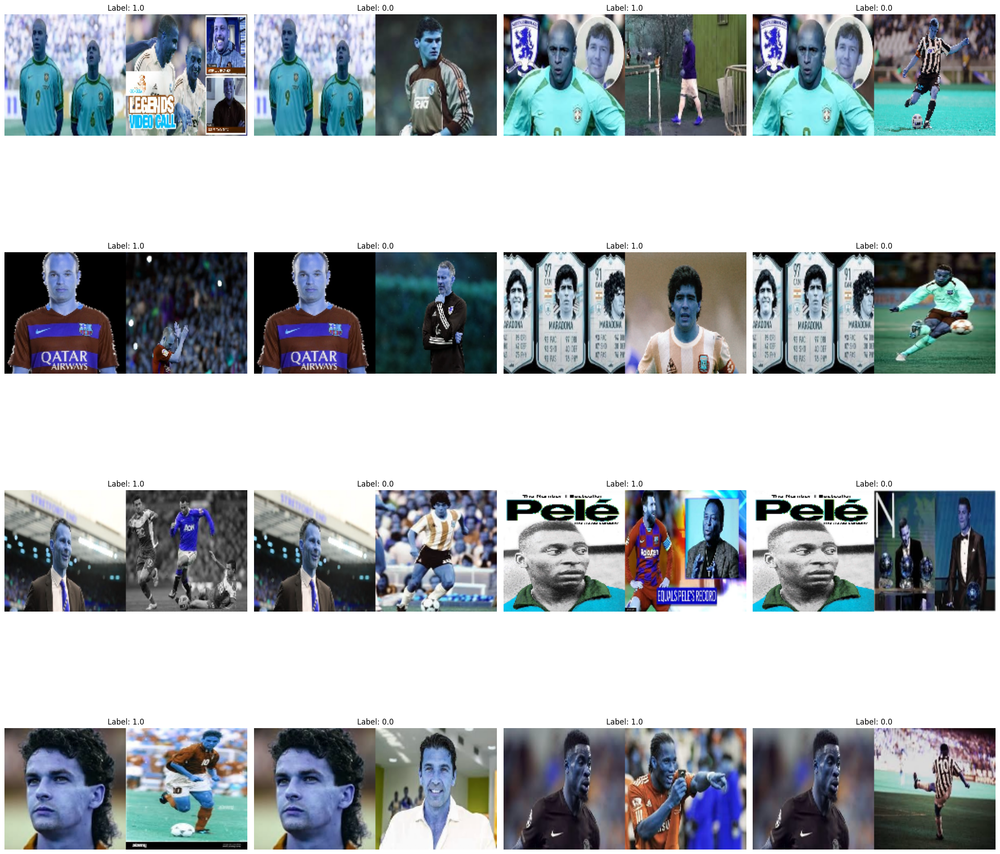

In [14]:
visualize(pairs_train, labels_train, to_show=16, num_col=4)


# Visualize validation pairs

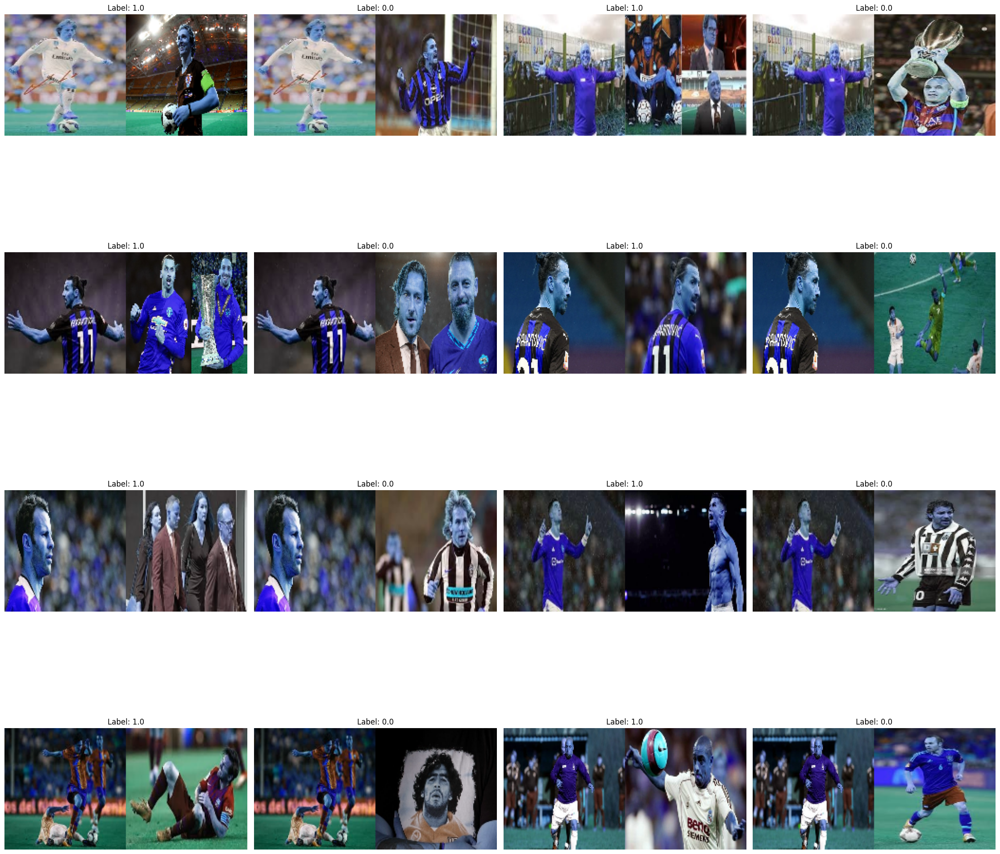

In [15]:
visualize(pairs_val, labels_val, to_show=16, num_col=4)

# Visualize Test Pairs

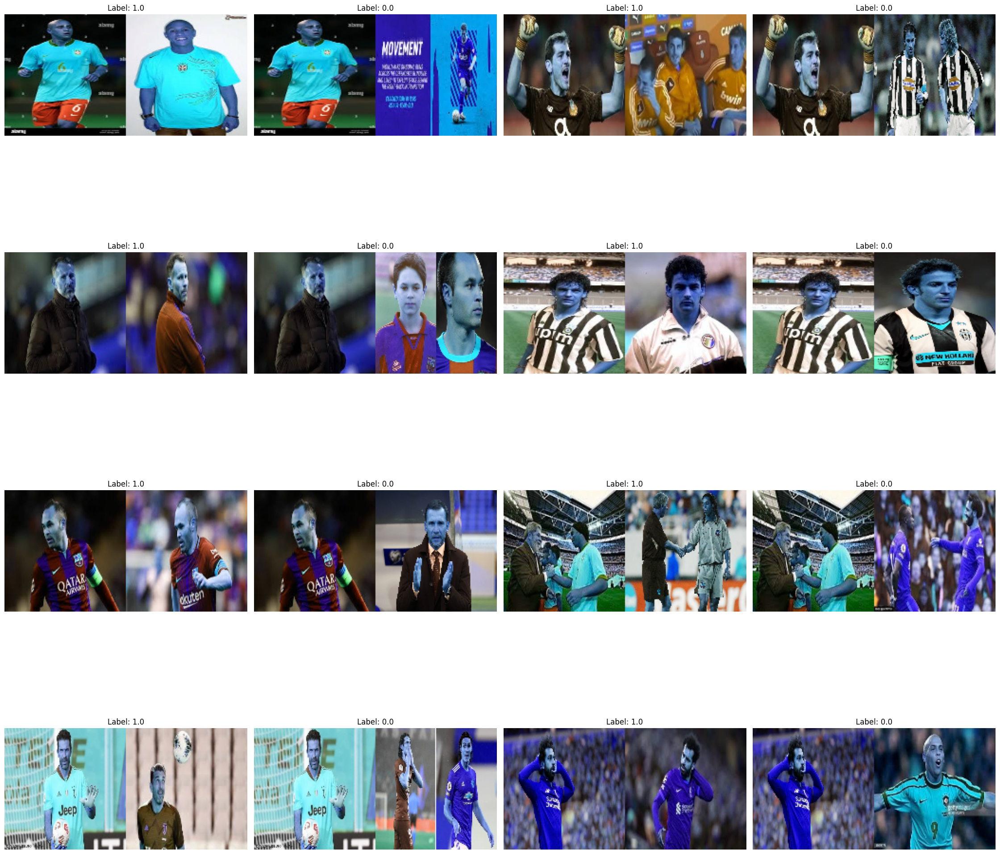

In [16]:
visualize(pairs_test, labels_test, to_show=16, num_col=4)

# Define Model

In [17]:
# Provided two tensors t1 and t2
# Euclidean distance = sqrt(sum(square(t1-t2)))
def euclidean_distance(vects):
    """Find the Euclidean distance between two vectors.

    Arguments:
        vects: List containing two tensors of same length.

    Returns:
        Tensor containing euclidean distance
        (as floating point value) between vectors.
    """

    x, y = vects
    sum_square = tf.math.reduce_sum(tf.math.square(x - y), axis=1, keepdims=True)
    return tf.math.sqrt(tf.math.maximum(sum_square, tf.keras.backend.epsilon()))



# Define embedding network with deeper architecture
input = layers.Input((128, 128, 3))
x = tf.keras.layers.BatchNormalization()(input)
x = layers.Conv2D(32, (5, 5), activation="relu")(x)
x = layers.AveragePooling2D(pool_size=(2, 2))(x)
x = layers.Conv2D(64, (5, 5), activation="relu")(x)
x = layers.AveragePooling2D(pool_size=(2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation="relu")(x)
x = layers.AveragePooling2D(pool_size=(2, 2))(x)
x = layers.Flatten()(x)
x = tf.keras.layers.BatchNormalization()(x)
x = layers.Dense(256, activation="relu")(x)
x = layers.Dropout(0.2)(x)
embedding_network = keras.Model(input, x)

# Build Siamese network
input_1 = layers.Input((128, 128, 3))
input_2 = layers.Input((128, 128, 3))
tower_1 = embedding_network(input_1)
tower_2 = embedding_network(input_2)
merge_layer = layers.Lambda(euclidean_distance)([tower_1, tower_2])
normal_layer = tf.keras.layers.BatchNormalization()(merge_layer)
output_layer = layers.Dense(1, activation="sigmoid")(normal_layer)
model = keras.Model(inputs=[input_1, input_2], outputs=output_layer)


# Loss Function

In [18]:
def loss(margin=1):
    """Provides 'constrastive_loss' an enclosing scope with variable 'margin'.

  Arguments:
      margin: Integer, defines the baseline for distance for which pairs
              should be classified as dissimilar. - (default is 1).

  Returns:
      'constrastive_loss' function with data ('margin') attached.
  """

    # Contrastive loss = mean( (1-true_value) * square(prediction) +
    #                         true_value * square( max(margin-prediction, 0) ))
    def contrastive_loss(y_true, y_pred):
        """Calculates the constrastive loss.

      Arguments:
          y_true: List of labels, each label is of type float32.
          y_pred: List of predictions of same length as of y_true,
                  each label is of type float32.

      Returns:
          A tensor containing constrastive loss as floating point value.
      """

        square_pred = tf.math.square(y_pred)
        margin_square = tf.math.square(tf.math.maximum(margin - (y_pred), 0))
        return tf.math.reduce_mean(
            (1 - y_true) * square_pred + (y_true) * margin_square
        )

    return contrastive_loss

# Compile Model

In [19]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
margin = 1
learning_rate=0.001
optimizer = Adam(learning_rate=learning_rate)

model.compile(loss=loss(margin=margin), optimizer=optimizer, metrics=["accuracy"])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_2             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional (Functional)   │ (None, 256)            │      5,752,140 │ input_layer_1[0][0],   │
│                           │                        │                │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 1)              │              0 │ functional[0][0],      │
│                           │                        │                │ functional[1][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 1)              │              4 │ lambda[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │              2 │ batch_normalization_2… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 5,752,146 (21.94 MB)

 Trainable params: 5,708,874 (21.78 MB)

 Non-trainable params: 43,272 (169.03 KB)

In [20]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)

In [21]:
history = model.fit(
                [X_train_1, X_train_2],
                labels_train,
                validation_data=([X_val_1, X_val_2], labels_val),
                batch_size=32,
                epochs=100,callbacks=[early_stopping, reduce_lr])

Epoch 1/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.4965 - loss: 0.2947 - val_accuracy: 0.4882 - val_loss: 0.4320 - learning_rate: 0.0010
Epoch 2/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.4980 - loss: 0.2736 - val_accuracy: 0.5014 - val_loss: 0.2635 - learning_rate: 0.0010
Epoch 3/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.4998 - loss: 0.2596 - val_accuracy: 0.4948 - val_loss: 0.2560 - learning_rate: 0.0010
Epoch 4/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.5084 - loss: 0.2535 - val_accuracy: 0.5014 - val_loss: 0.2534 - learning_rate: 0.0010
Epoch 5/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.5034 - loss: 0.2526 - val_accuracy: 0.5014 - val_loss: 0.2528 - learning_rate: 0.0010
Epoch 6/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.5254 - loss: 0.2500 - val_accuracy: 0.4899 - val_loss: 0.2523 - learning_rate: 0.0010
Epoch 7/100
270/270 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.5326 - 

# Loss & Accuracy Graph

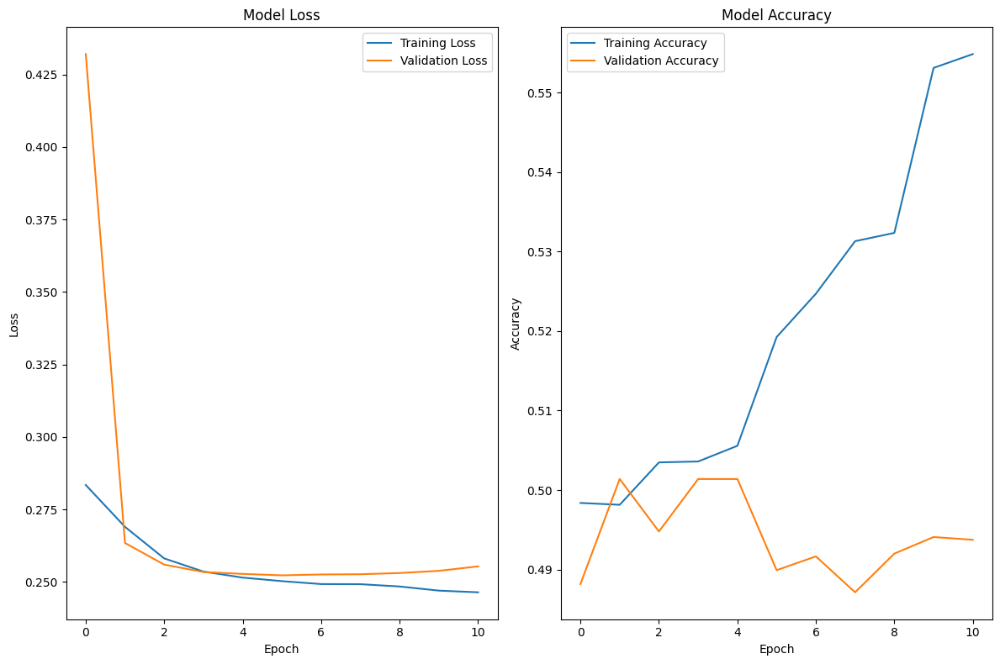

In [22]:
# Plotting Loss and Accuracy
plt.figure(figsize=(12, 8))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Evaluate Model

In [23]:
results = model.evaluate([X_test_1, X_test_2], labels_test)
print(f"Model Loss : {results[0]}")
print(f"Model Accuracy : {results[1]}")

90/90 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4711 - loss: 0.2527
Model Loss : 0.25278598070144653
Model Accuracy : 0.4742698073387146


# Model prediction

In [24]:


def visualize(pairs, labels, to_show=6, num_col=4, predictions=None, test=False):
    # Calculate number of rows
    num_row = to_show // num_col if to_show // num_col != 0 else 1
    
    to_show = num_row * num_col

    # Plot the images
    fig, axes = plt.subplots(num_row, num_col, figsize=(15, 15))
    
    for i in range(to_show):
        # If the number of rows is 1, the axes array is one-dimensional
        if num_row == 1:
            ax = axes[i % num_col]
        else:
            ax = axes[i // num_col, i % num_col]

        ax.imshow(tf.concat([pairs[i][0], pairs[i][1]], axis=1), cmap="gray")
        ax.set_axis_off()

        if predictions is not None:
            # Prediction logic: True label vs Predicted label
            if labels[i] == (predictions[i] > 0.5):  # Adjusting the prediction threshold (0.5 for binary)
                color = 'green'
            else:
                color = 'red'

            ax.set_title(f"True: {labels[i]} | Pred: {int(predictions[i] > 0.5)}", color=color)
        else:
            ax.set_title(f"Label: {labels[i]}")
    
    if test:
        plt.tight_layout(rect=(0, 0, 1.9, 1.9), w_pad=0.0)
    else:
        plt.tight_layout(rect=(0, 0, 1.5, 1.5))
    plt.show()



90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step


<ipython-input-24-49c5665b8053>:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ax.set_title(f"True: {labels[i]} | Pred: {int(predictions[i] > 0.5)}", color=color)


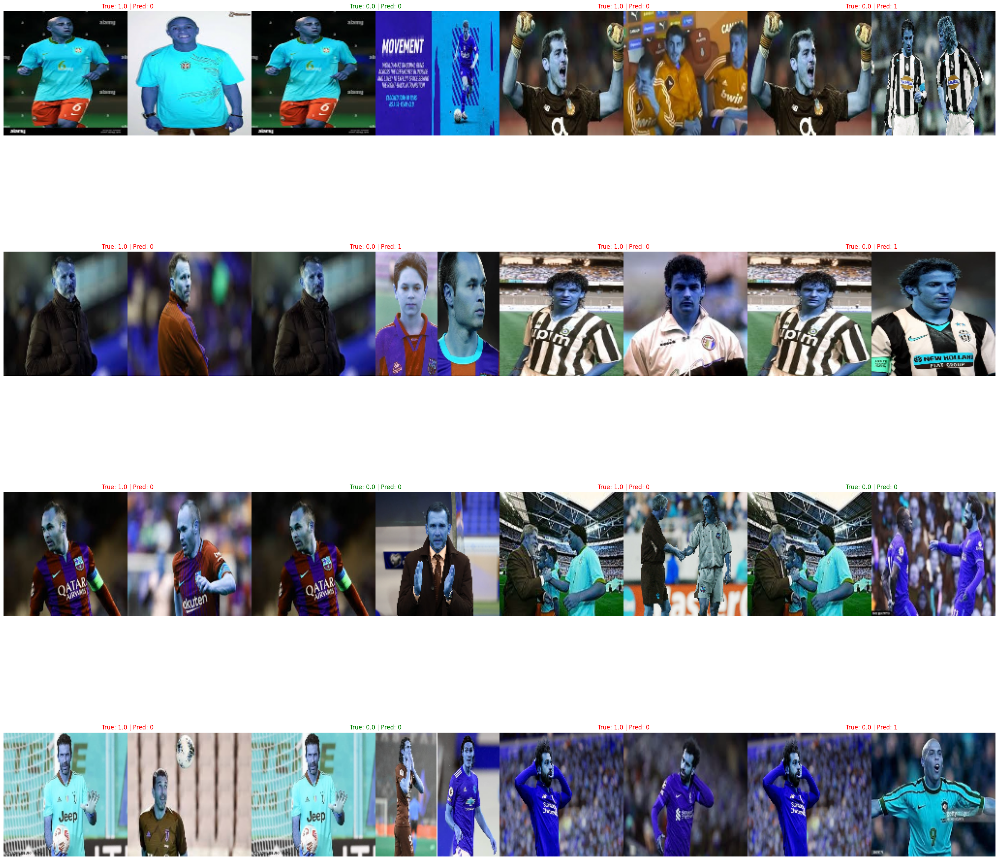

In [25]:
predictions = model.predict([X_test_1, X_test_2])
visualize(pairs_test, labels_test, to_show=16, predictions=predictions, test=True)